In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 901.7/901.7 kB 23.8 MB/s eta 0:00:00


In [3]:
from ultralytics import YOLO
import os
import matplotlib.pyplot as plt
from PIL import Image
import random

# Load the YOLO model
model = YOLO('/content/drive/MyDrive/VQA-Final/part A /YOLO/YOLO runs/detect/train/weights/best.pt')
test_folder = '/content/drive/MyDrive/VQA-Final/part A /YOLO/YOLO dataset /dataset-part-A/dataset-part-A/test/images'


image_files = [os.path.join(test_folder, f) for f in os.listdir(test_folder) if f.endswith(('.jpg', '.jpeg', '.png'))]
random_images = random.sample(image_files, min(5, len(image_files)))

results = model(random_images)

for i, result in enumerate(results):
    # Save result image to disk
    result_image_path = os.path.join(test_folder, f"result_{i}.jpg")
    result.save(filename=result_image_path)

    # Load and display the result image
    result_image = Image.open(result_image_path)
    plt.figure(figsize=(10, 10))
    plt.imshow(result_image)
    plt.title(f"Result for {os.path.basename(random_images[i])}")
    plt.axis('off')
    plt.show()

    print(f"Processed {random_images[i]} and saved result to {result_image_path}")


Output hidden; open in https://colab.research.google.com to view.

In [4]:
print(model)

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1))
          (act): SiLU(inplace=True)
        )
        (m): ModuleList(
          (0): Bottleneck(
            (cv1): Conv(
              (conv): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
              (act): SiLU(inplace=True)
            )
            (cv2): Conv(
              (conv): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
              (act): SiLU(inplace=True)
   

In [5]:
import torch

feature_maps = []

def hook_fn(module, input, output):
    feature_maps.append(output)

# Register hook to specific layers
for layer in model.model.model[:20]:  # Example: first 3 layers of the model
    layer.register_forward_hook(hook_fn)


In [15]:
 from google.colab.patches import cv2_imshow

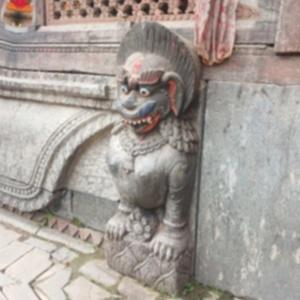


0: 640x640 1 yali, 243.9ms
Speed: 0.0ms preprocess, 243.9ms inference, 6.4ms postprocess per image at shape (1, 3, 640, 640)


In [17]:
import cv2
import numpy as np
import torch

# Load and preprocess an image
img_path = '/content/drive/MyDrive/VQA-Final/part A /YOLO/YOLO dataset /dataset-part-A/dataset-part-A/test/images/Yali_L_45_aug_6_jpg.rf.3746cb422239854402bde96693303b0e.jpg'
img = cv2.imread(img_path)

# Check if the image loaded successfully
if img is None:
    print(f"Error: Could not load image from {img_path}. Please check the file path.")
else:
    # Display the image using OpenCV
    cv2_imshow(img)
    cv2.waitKey(0)  # Wait for a key press to close the image window
    cv2.destroyAllWindows()

    # Preprocess for YOLO
    img = cv2.resize(img, (640, 640))  # Resize to YOLO input size
    img = torch.from_numpy(img).float().permute(2, 0, 1).unsqueeze(0) / 255.0  # Normalize and add batch dimension

    # Run the forward pass
    _ = model(img)


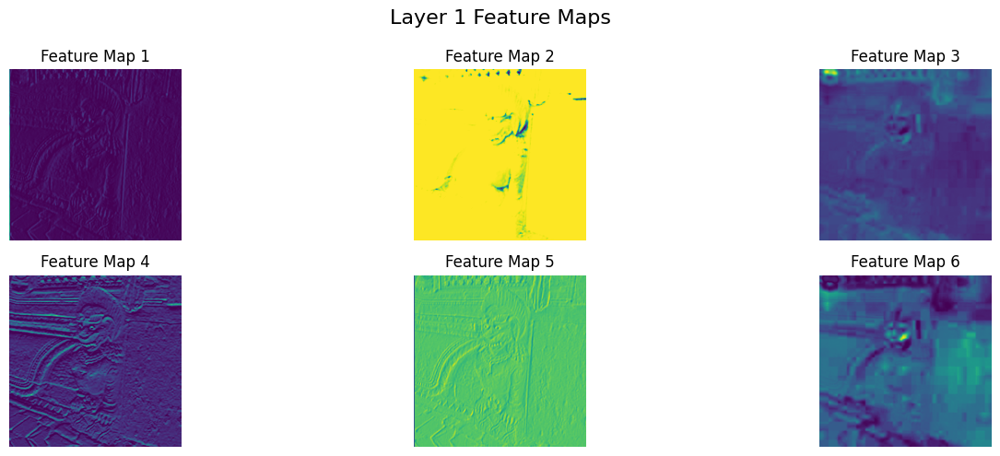

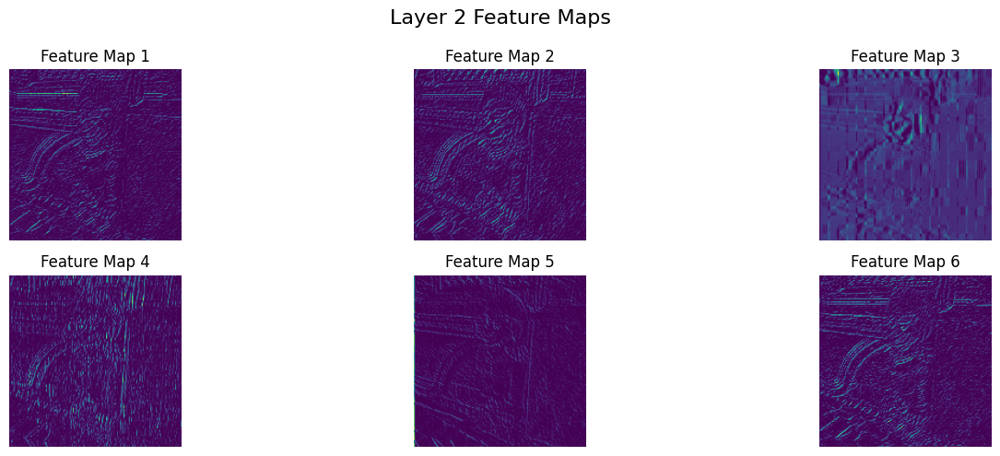

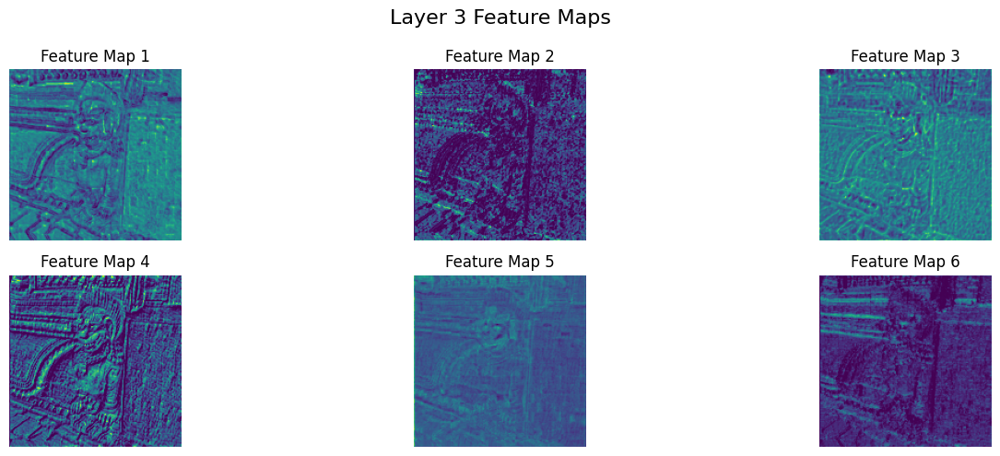

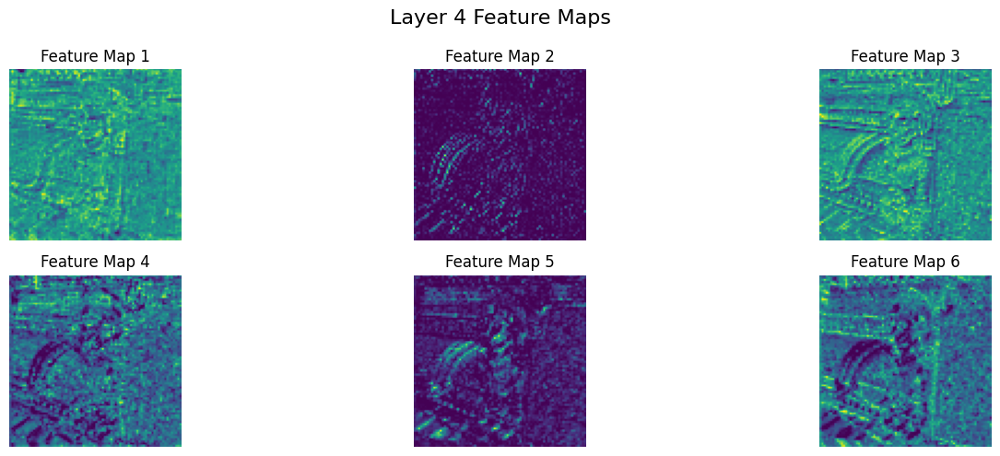

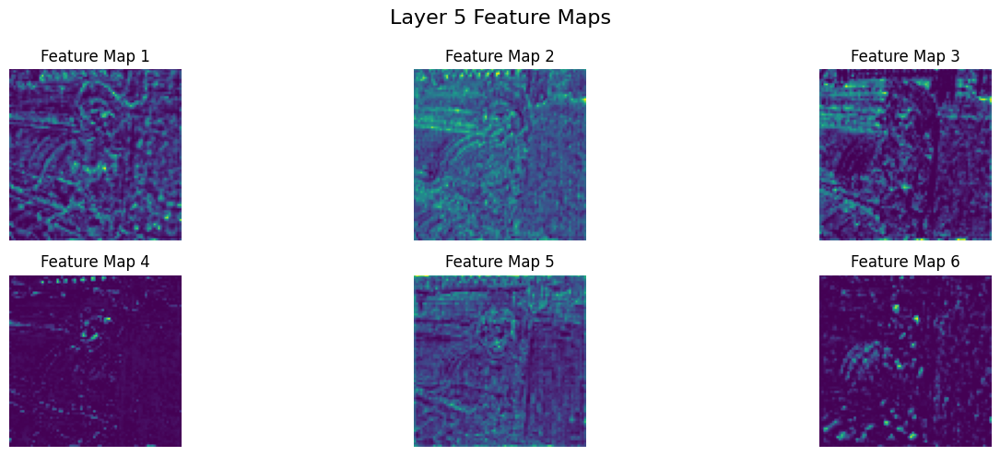

...

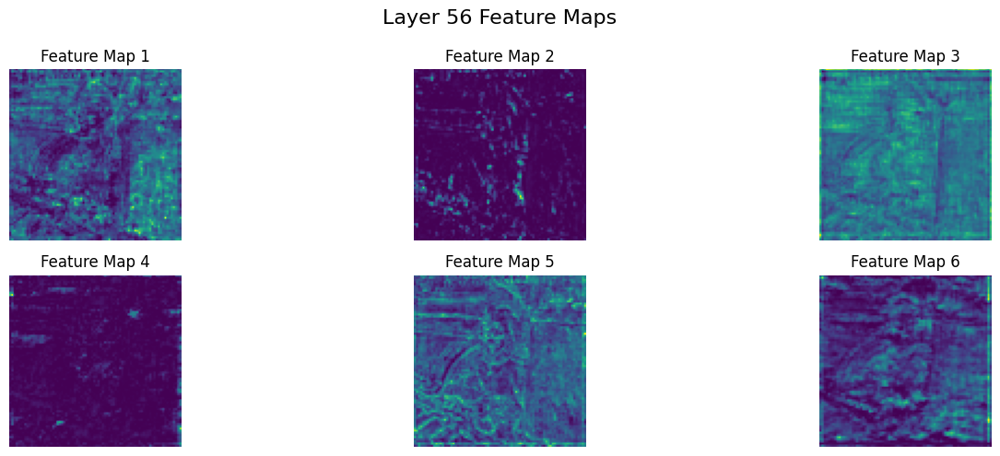

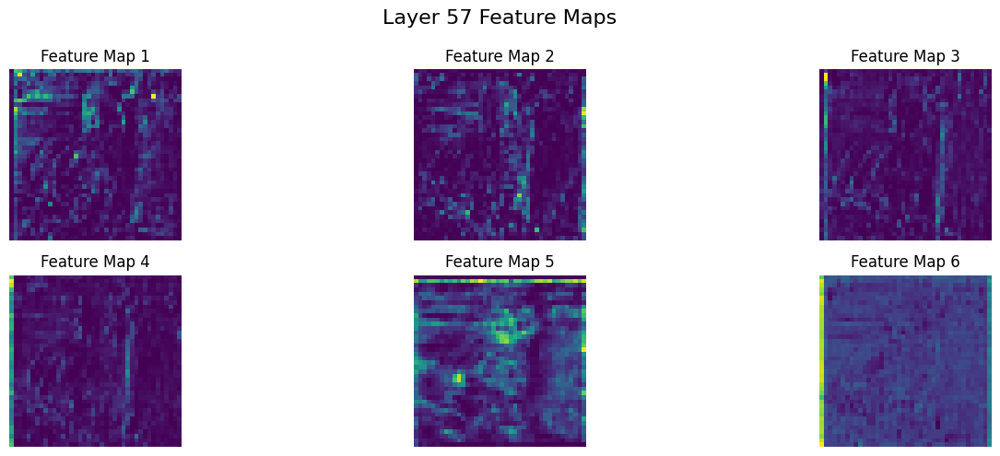

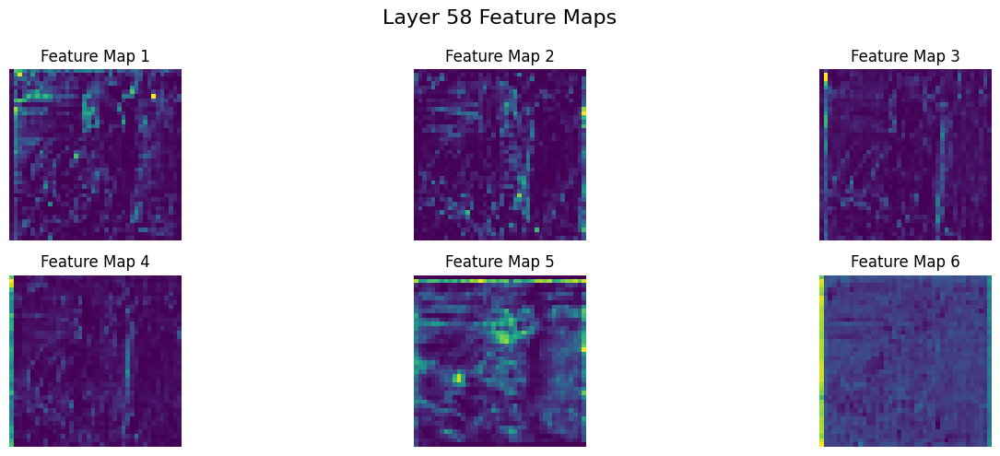

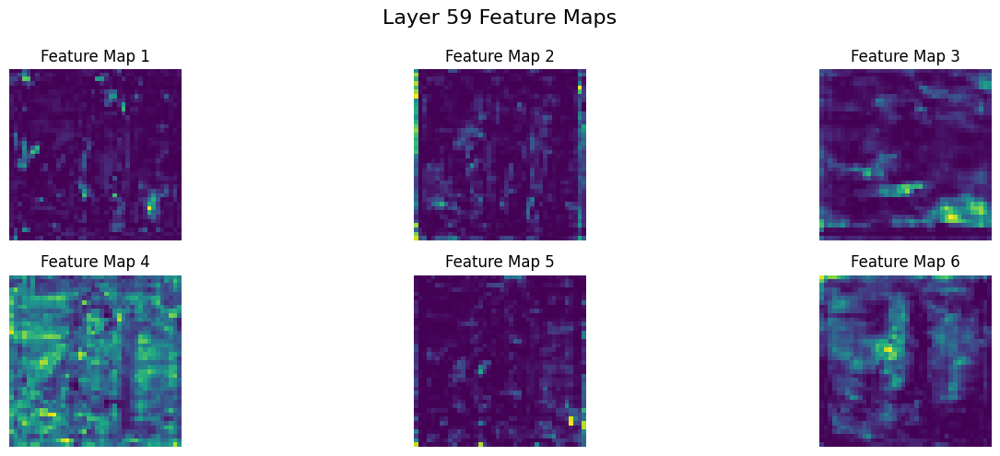

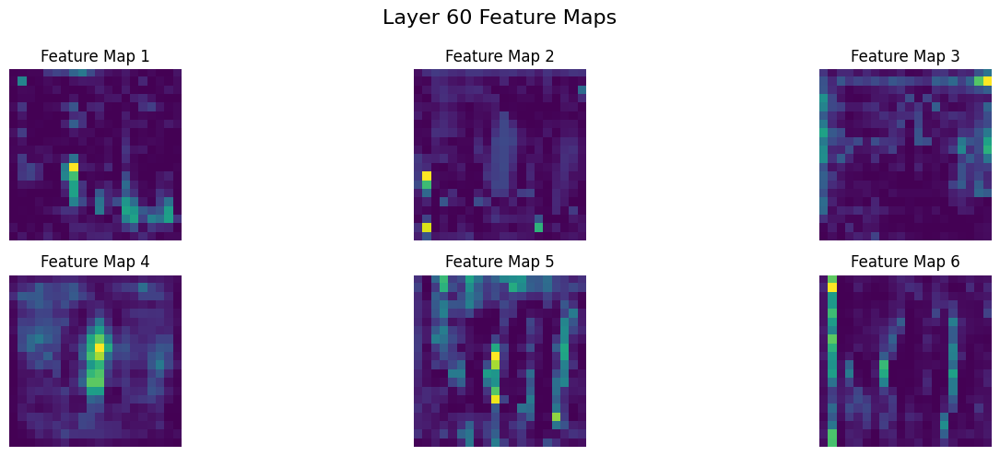

In [19]:
import matplotlib.pyplot as plt

# Visualize the feature maps
for i, fmap in enumerate(feature_maps):
    fmap = fmap.detach().cpu().numpy()
    # Choose the number of feature maps to display
    num_feature_maps = min(fmap.shape[1], 6)  # Display up to 6 feature maps for simplicity

    # Create a grid layout for feature maps
    cols = 3  # Number of columns
    rows = (num_feature_maps + cols - 1) // cols  # Calculate number of rows

    fig, axes = plt.subplots(rows, cols, figsize=(15, 5))
    fig.suptitle(f'Layer {i+1} Feature Maps', fontsize=16)

    for j in range(rows * cols):
        ax = axes[j // cols, j % cols]
        if j < num_feature_maps:
            ax.imshow(fmap[0, j, :, :], cmap='viridis')
            ax.set_title(f'Feature Map {j+1}')
        else:
            ax.axis('off')  # Turn off extra subplots

        ax.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.85)  # Adjust the title position
    plt.show()
